In [23]:
import sys

#import params_Jay as params
#params.set_gpu_env()

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import TensorDataset, DataLoader

import cmasher as cmr

from tqdm import tqdm 
import numpy as np
from skimage.transform import resize
from sklearn.metrics import mean_squared_error

import matplotlib.pyplot as plt
import matplotlib

import os
import glob

from sklearn.utils import shuffle
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.cluster import DBSCAN, KMeans, SpectralClustering, AgglomerativeClustering, OPTICS
from sklearn.cluster import *
from sklearn import cluster
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.decomposition import PCA, KernelPCA, NMF
from sklearn.manifold import TSNE
from sklearn import manifold
from sklearn.metrics import silhouette_samples, silhouette_score
from skimage import filters
from umap import UMAP
import plotly.express as px


from scipy.signal import argrelextrema
import time
import pandas as pd

torch.__version__

image_cmap = plt.cm.inferno


class recon_encoder(nn.Module):

    def __init__(self, latent_size, nconv=16, pool=4, drop=0.05):
        super(recon_encoder, self).__init__()


        self.encoder = nn.Sequential( # Appears sequential has similar functionality as TF avoiding need for separate model definition and activ
          nn.Conv2d(in_channels=1, out_channels=nconv, kernel_size=3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv, nconv, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.MaxPool2d((pool,pool)),

          nn.Conv2d(nconv, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),          
          nn.ReLU(),
          nn.MaxPool2d((pool,pool)),

          nn.Conv2d(nconv*2, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),     
          nn.Dropout(drop),     
          nn.ReLU(),
          nn.MaxPool2d((pool,pool)),

          #nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          #nn.Dropout(drop),
          #nn.ReLU(),
          #nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),     
          #nn.Dropout(drop),     
          #nn.ReLU(),
          #nn.MaxPool2d((pool,pool)),
        )


        self.bottleneck = nn.Sequential(
          # FC layer at bottleneck -- dropout might not make sense here
          nn.Flatten(),
          nn.Linear(1024, latent_size),
          #nn.Dropout(drop),
          nn.ReLU(),
#          nn.Linear(latent_size, 1024),
#          #nn.Dropout(drop),
#          nn.ReLU(),
#          nn.Unflatten(1,(64,4,4))# 0 is batch dimension
          )


        self.decoder1 = nn.Sequential(

          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Upsample(scale_factor=pool, mode='bilinear'),

          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Upsample(scale_factor=pool, mode='bilinear'),

          nn.Conv2d(nconv*4, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Upsample(scale_factor=pool, mode='bilinear'),
            
          #nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          #nn.Dropout(drop),
          #nn.ReLU(),
          #nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          #nn.Dropout(drop),
          #nn.ReLU(),
          #nn.Upsample(scale_factor=pool, mode='bilinear'),

          nn.Conv2d(nconv*2, 1, 3, stride=1, padding=(1,1)), #Output conv layer has 2 for mu and sigma
          nn.Sigmoid() #Amplitude mode
          )
    

    def forward(self,x):
        with torch.cuda.amp.autocast():
            x1 = self.encoder(x)
            x1 = self.bottleneck(x1)
            #print(x1.shape)
            return x1


    #Helper function to calculate size of flattened array from conv layer shapes    
    def calc_fc_shape(self):
        x0 = torch.zeros([256,256]).unsqueeze(0)
        x0 = self.encoder(x0)

        self.conv_bock_output_shape = x0.shape
        #print ("Output of conv block shape is", self.conv_bock_output_shape)
        self.flattened_size = x0.flatten().shape[0]
        #print ("Flattened layer size is", self.flattened_size)
        return self.flattened_size

class recon_model(nn.Module):

    def __init__(self, latent_size, nconv=16, pool=4, drop=0.05):
        super(recon_model, self).__init__()


        self.encoder = nn.Sequential( # Appears sequential has similar functionality as TF avoiding need for separate model definition and activ
          nn.Conv2d(in_channels=1, out_channels=nconv, kernel_size=3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv, nconv, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.MaxPool2d((pool,pool)),

          nn.Conv2d(nconv, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),          
          nn.ReLU(),
          nn.MaxPool2d((pool,pool)),

          nn.Conv2d(nconv*2, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),     
          nn.Dropout(drop),     
          nn.ReLU(),
          nn.MaxPool2d((pool,pool)),

          #nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          #nn.Dropout(drop),
          #nn.ReLU(),
          #nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),     
          #nn.Dropout(drop),     
          #nn.ReLU(),
          #nn.MaxPool2d((pool,pool)),
        )


        self.bottleneck = nn.Sequential(
          # FC layer at bottleneck -- dropout might not make sense here
          nn.Flatten(),
          nn.Linear(1024, latent_size),
          #nn.Dropout(drop),
          nn.ReLU(),
          nn.Linear(latent_size, 1024),
          #nn.Dropout(drop),
          nn.ReLU(),
          nn.Unflatten(1,(64,4,4))# 0 is batch dimension
          )


        self.decoder1 = nn.Sequential(

          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Upsample(scale_factor=pool, mode='bilinear'),

          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Upsample(scale_factor=pool, mode='bilinear'),

          nn.Conv2d(nconv*4, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Upsample(scale_factor=pool, mode='bilinear'),
            
          #nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          #nn.Dropout(drop),
          #nn.ReLU(),
          #nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          #nn.Dropout(drop),
          #nn.ReLU(),
          #nn.Upsample(scale_factor=pool, mode='bilinear'),

          nn.Conv2d(nconv*2, 1, 3, stride=1, padding=(1,1)), #Output conv layer has 2 for mu and sigma
          nn.Sigmoid() #Amplitude mode
          )
    

    def forward(self,x):
        with torch.cuda.amp.autocast():
            x1 = self.encoder(x)
            x1 = self.bottleneck(x1)
            #print(x1.shape)
            return self.decoder1(x1)


    #Helper function to calculate size of flattened array from conv layer shapes    
    def calc_fc_shape(self):
        x0 = torch.zeros([256,256]).unsqueeze(0)
        x0 = self.encoder(x0)

        self.conv_bock_output_shape = x0.shape
        #print ("Output of conv block shape is", self.conv_bock_output_shape)
        self.flattened_size = x0.flatten().shape[0]
        #print ("Flattened layer size is", self.flattened_size)
        return self.flattened_size
    
class recon_decoder(nn.Module):

    def __init__(self, latent_size, nconv=16, pool=4, drop=0.05):
        super(recon_decoder, self).__init__()

        self.bottleneck = nn.Sequential(
            nn.Linear(latent_size, 1024),
            nn.ReLU(),
            nn.Unflatten(1,(64,4,4))
        )


        self.decoder1 = nn.Sequential(

          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Upsample(scale_factor=pool, mode='bilinear'),

          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*4, nconv*4, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Upsample(scale_factor=pool, mode='bilinear'),

          nn.Conv2d(nconv*4, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          nn.Dropout(drop),
          nn.ReLU(),
          nn.Upsample(scale_factor=pool, mode='bilinear'),
            
          #nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          #nn.Dropout(drop),
          #nn.ReLU(),
          #nn.Conv2d(nconv*2, nconv*2, 3, stride=1, padding=(1,1)),
          #nn.Dropout(drop),
          #nn.ReLU(),
          #nn.Upsample(scale_factor=pool, mode='bilinear'),

          nn.Conv2d(nconv*2, 1, 3, stride=1, padding=(1,1)), #Output conv layer has 2 for mu and sigma
          nn.ReLU()
            #nn.Sigmoid() #Amplitude mode
          )
    

    def forward(self,x):
        with torch.cuda.amp.autocast():
            #x1 = self.encoder(x)
            x1 = self.bottleneck(x)
            #print(x1.shape)
            return self.decoder1(x1)

In [2]:
rheo_images = np.load('analysis_data/E031_256.npy') ### needs to be downloaded from https://anl.app.box.com/s/dhqahh467gnv0srz0tct1ymaofgr07te
rheo_raw = rheo_images.reshape(-1,rheo_images.shape[1]*rheo_images.shape[2])  ### Test dataset, raw
rheo_encoded = np.load('analysis_data/full_dataset_AugmentedTraining_rheo64.npy')
rheo_sectors = np.load('analysis_data/E031_256_sectors.npy')
rheo_times = np.load('analysis_data/E031_256_start.npy')
rheo_data = pd.read_pickle('analysis_data/RheoData.pkl')

In [3]:
full_model = recon_model(latent_size=64)
full_model.load_state_dict(torch.load('AutoEncoder/weights/full_dataset_augmented_training_normbest_model_0051.pth',map_location=torch.device('cpu')))

#full_model = torch.load('/Users/jhorwath/Documents/XPCS_Analysis/Dec2021_Dataset/Dec2021_dataset/C2_Classification/best_model_0097.pth',map_location=torch.device('cpu')).float()
summary(full_model,(1,256,256),device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 256, 256]             160
           Dropout-2         [-1, 16, 256, 256]               0
              ReLU-3         [-1, 16, 256, 256]               0
            Conv2d-4         [-1, 16, 256, 256]           2,320
           Dropout-5         [-1, 16, 256, 256]               0
              ReLU-6         [-1, 16, 256, 256]               0
         MaxPool2d-7           [-1, 16, 64, 64]               0
            Conv2d-8           [-1, 32, 64, 64]           4,640
           Dropout-9           [-1, 32, 64, 64]               0
             ReLU-10           [-1, 32, 64, 64]               0
           Conv2d-11           [-1, 32, 64, 64]           9,248
          Dropout-12           [-1, 32, 64, 64]               0
             ReLU-13           [-1, 32, 64, 64]               0
        MaxPool2d-14           [-1, 32,

/opt/anaconda3/envs/pytorch/lib/python3.10/site-packages/torch/amp/autocast_mode.py:198: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


In [4]:
decoder_model = recon_decoder(latent_size=64)
decoder_state_dict = decoder_model.state_dict()

checkpoint = torch.load('AutoEncoder/weights/full_dataset_augmented_training_normbest_model_0051.pth',map_location=torch.device('cpu'))

checkpoint['bottleneck.0.weight'] = checkpoint['bottleneck.3.weight']
checkpoint['bottleneck.0.bias'] = checkpoint['bottleneck.3.bias']

pretrained_dict = {k: v for k, v in checkpoint.items() if k in decoder_state_dict}

decoder_model.load_state_dict(pretrained_dict)

<All keys matched successfully>

# Perform Clustering in Latent Space

Text(0, 0.5, 'silhouette score')

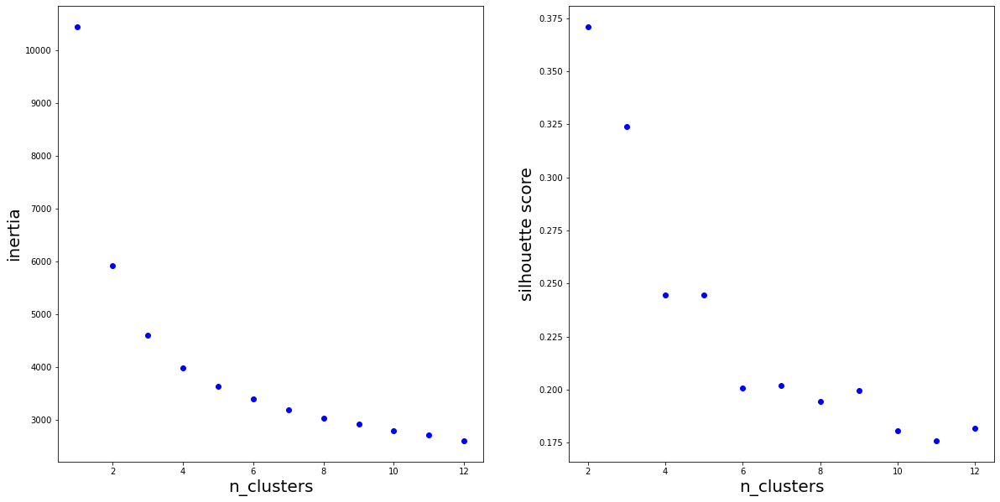

In [5]:
cluster_range = np.arange(1,13)

fig, ax = plt.subplots(figsize=(20,10),ncols=2)

for n_clusters in cluster_range:
    kmeans = KMeans(n_clusters = n_clusters)
    cluster_labels = kmeans.fit_predict(rheo_encoded)
    ax[0].scatter(n_clusters,kmeans.inertia_,color='blue')
    try:
        ax[1].scatter(n_clusters,silhouette_score(rheo_encoded,cluster_labels),color='blue')
    except ValueError:
        continue
    
ax[0].set_xlabel('n_clusters',fontsize=20)
ax[0].set_ylabel('inertia',fontsize=20)

ax[1].set_xlabel('n_clusters',fontsize=20)
ax[1].set_ylabel('silhouette score',fontsize=20)
#fig.savefig('new_figures/elbow.svg')

The elbow in the inertia plots appears at 4-6 clusters, suggesting that this is the ideal number of clusters.

Now, we will use KMeans clustering (5 clusters) to separate the dataset, and test different dimensionality reduction techniques for visualization.

/opt/anaconda3/envs/pytorch/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


cluster 0: n = 254
cluster 1: n = 249
cluster 2: n = 115
cluster 3: n = 259
cluster 4: n = 23


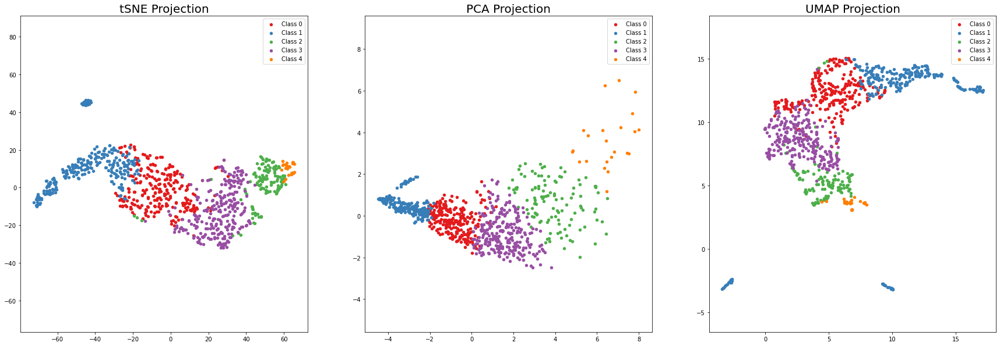

In [6]:
kmeans5 = KMeans(n_clusters=5)
cluster_labels = kmeans5.fit_predict(rheo_encoded)


tsne = TSNE(n_components=2,perplexity=20,learning_rate=10,n_iter=2500,init='pca')
tsne_trans = tsne.fit_transform(rheo_encoded)

pca = PCA(n_components=2)
pca_trans = pca.fit_transform(rheo_encoded)

#reducer = UMAP(n_components=2,n_neighbors=15,min_dist=0.01,metric='euclidean')
reducer = UMAP(n_components=2,n_neighbors=5,min_dist=0.25,metric='euclidean',random_state=42)
embedding = reducer.fit_transform(rheo_encoded)

colors = plt.cm.Set1(np.linspace(0,1,9))
n1 = 0
unique_labels = np.unique(cluster_labels)
fig, ax = plt.subplots(1,3,figsize=(30,10))
for i in unique_labels:
    data_tsne = tsne_trans[cluster_labels[:] == i]
    data_pca = pca_trans[cluster_labels[:] == i]
    data_embedding = embedding[cluster_labels[:] == i]
    
    print('cluster {}: n = {}'.format(i,len(data_tsne)))
    
    ax[0].scatter(data_tsne[:,0],data_tsne[:,1],color=colors[i],s=20,label='Class {}'.format(np.unique(cluster_labels)[i]))
    ax[1].scatter(data_pca[:,0],data_pca[:,1],color=colors[i],s=20,label='Class {}'.format(np.unique(cluster_labels)[i]))
    ax[2].scatter(data_embedding[:,0],data_embedding[:,1],color=colors[i],s=20,label='Class {}'.format(np.unique(cluster_labels)[i]))
    n1 += 1
    
ax[0].set_title("tSNE Projection",fontsize=20)
ax[0].axis('equal')
ax[0].legend()

ax[1].set_title("PCA Projection",fontsize=20)
ax[1].axis('equal')
ax[1].legend()

ax[2].set_title('UMAP Projection',fontsize=20)
ax[2].axis('equal')
ax[2].legend()
#fig.savefig('new_figures/tSNE_RheoOnly_5clusters.svg')

In [ ]:
agg = AgglomerativeClustering(n_clusters=5)
agg_clusters = agg.fit_predict(rheo_encoded)

spec = SpectralClustering(n_clusters=5)
spec_clusters = spec.fit_predict(rheo_encoded)

fig, ax = plt.subplots(figsize=(30,10),ncols=3)
for i in range(5):
    agg_ind = np.where(agg_clusters[:] == i)[0]
    spec_ind = np.where(spec_clusters[:] == i)[0]
    kmeans_ind = np.where(cluster_labels[:] == i)[0]
    
    ax[0].scatter(embedding[kmeans_ind,0],embedding[kmeans_ind,1],color=colors[i],label='cluster {}'.format(i))
    ax[1].scatter(embedding[agg_ind,0],embedding[agg_ind,1],color=colors[i],label='cluster {}'.format(i))
    ax[2].scatter(embedding[spec_ind,0],embedding[spec_ind,1],color=colors[i],label='cluster {}'.format(i))
    
ax[0].set_title('KMeans Clustering',fontsize=20)
ax[1].set_title('Spectral Clustering',fontsize=20)
ax[2].set_title('Agglomerative Clustering',fontsize=20)

ax[0].legend()
ax[1].legend()
ax[2].legend()

UMAP provides the best combination of reproducibility and expressing the structure of the data.  We will use this embedding moving forward to visualize the data.

Now, cluster labels will be adjusted so that the follow the order of the data.

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(embedding[:,0],embedding[:,1],color='black',s=75)
r = np.random.choice(np.arange(len(rheo_encoded)),replace=False)
print(r)
ax.scatter(embedding[r,0],embedding[r,1],color='red',s=500,alpha=1)
ax.axis('equal')
ax.set_xlim([-1,18])
ax.set_ylim([2,15])
ax.set_xticks([])
ax.set_yticks([])

fig.tight_layout()
#fig.savefig('figures/UMAP_black_crop.png')
#fig.savefig('figures/UMAP_black_crop.svg')

cluster 0: n = 23
cluster 1: n = 115
cluster 2: n = 259
cluster 3: n = 254
cluster 4: n = 249


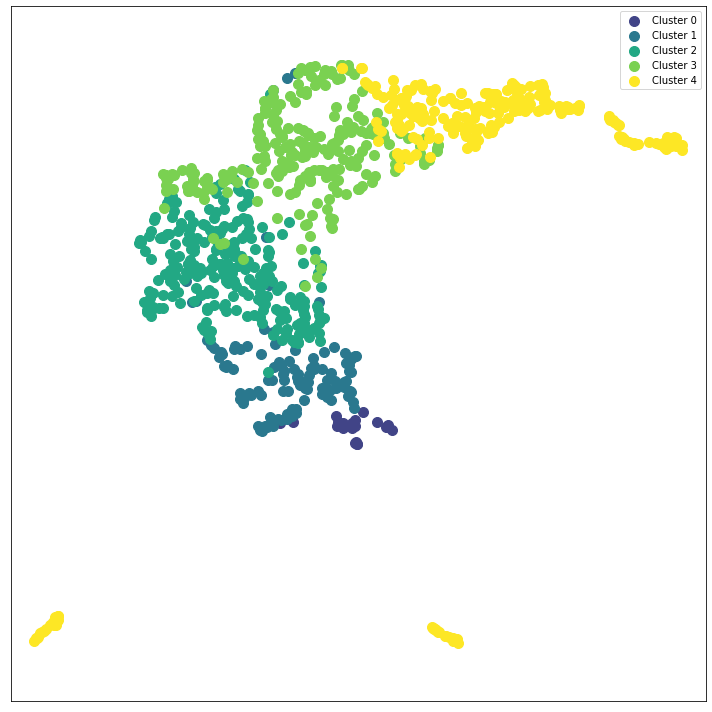

In [7]:
cluster_labels_1 = np.zeros_like(cluster_labels)
cluster_labels_1[cluster_labels[:] == 0] = 3
cluster_labels_1[cluster_labels[:] == 1] = 4
cluster_labels_1[cluster_labels[:] == 2] = 1
cluster_labels_1[cluster_labels[:] == 3] = 2
cluster_labels_1[cluster_labels[:] == 4] = 0

colors = plt.cm.viridis(np.linspace(0.2,1,5))
n1 = 0
unique_labels = np.unique(cluster_labels_1)
fig, ax = plt.subplots(figsize=(10,10))
for i in unique_labels:
    data_umap = embedding[cluster_labels_1[:] == i]
    
    print('cluster {}: n = {}'.format(i,len(data_umap)))
    ax.scatter(data_umap[:,0],data_umap[:,1],color=colors[i],s=100,label='Cluster {}'.format(np.unique(cluster_labels)[i]))

    n1 += 1
    


#ax.set_title('UMAP Projection',fontsize=20)
ax.legend(fontsize=16)

ax.axis('equal')
ax.set_xticks([])
ax.set_yticks([])
#ax.set_ylim([0,14])
#ax.set_xlim([-5,18])

fig.tight_layout()

#t_stamps = [55, 283, 1430]
#markers = ['+', '^', '*']
#
#for i in range(len(t_stamps)):
#    ind = np.where(rheo_times[:] == t_stamps[i])[0]
#    ax.scatter(embedding[ind,0],embedding[ind,1],color='black',marker=markers[i],s=200,label='t = {} s'.format(int(t_stamps[i])))
#    
ax.legend()

#fig.savefig('figures/UMAP_Clustering.png')
#fig.savefig('figures/UMAP_Clustering.svg')

Now that cluster labels match the structure of the dataset, let's visualize samples from each cluster to understand how each cluster relates to actual $C_2$ data.

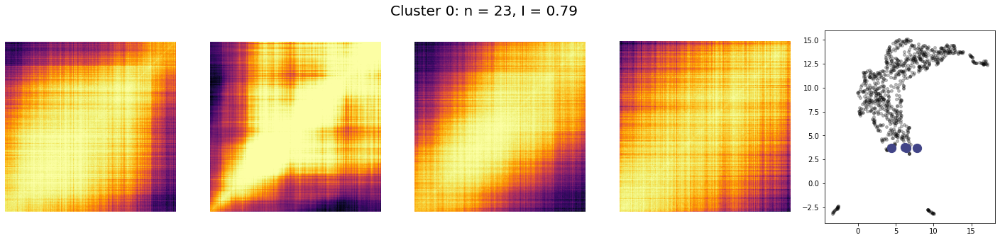

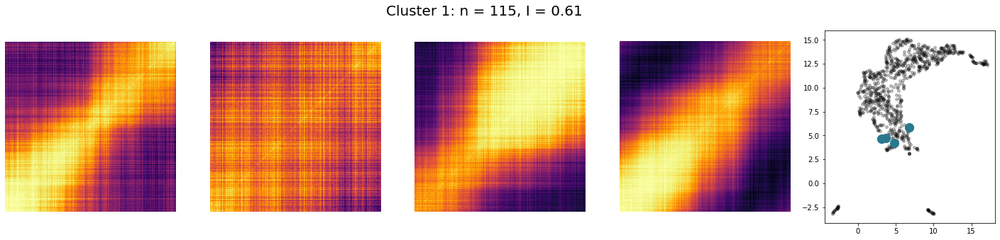

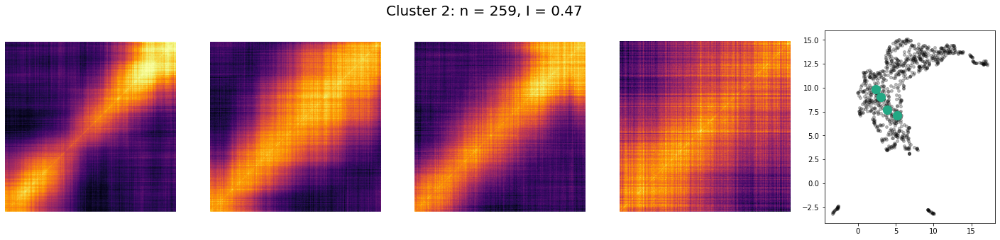

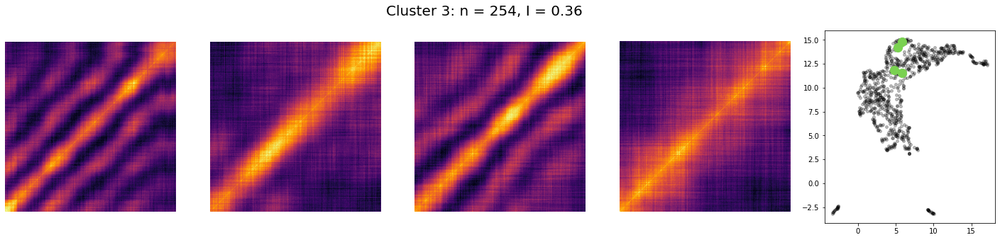

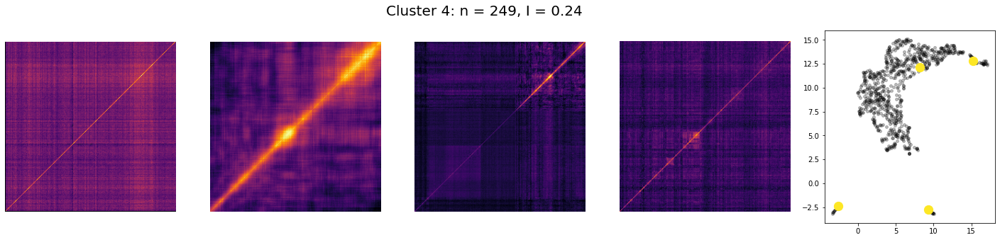

In [8]:
unique_clusters = np.unique(cluster_labels_1)

#colors = plt.cm.plasma(np.linspace(0.2,0.8,5))
n1 = 0

for i in unique_clusters:
    if i < 0:
        continue
    data = rheo_images[cluster_labels_1[:] == unique_clusters[i]]
    #data_scatter = tsne_trans[cluster_labels_1[:] == unique_clusters[i]]
    data_scatter = embedding[cluster_labels_1[:] == unique_clusters[i]]
    
    fig = plt.figure(figsize=(25,5))
    n_rows = 1
    n_cols = 5
    
    scatter_ax = fig.add_subplot(n_rows,n_cols,5)
    scatter_ax.scatter(embedding[:,0],embedding[:,1],s=15,color='black',alpha=0.25)
    
    n = np.random.choice(np.arange(len(data)),size=(4),replace=False)
    for j in range(len(n)):
        ax = fig.add_subplot(n_rows,n_cols,j+1)
        ax.imshow(data[n[j]],image_cmap,origin='lower')
        ax.axis('off')
        
        scatter_ax.scatter(data_scatter[n[j],0],data_scatter[n[j],1],color=colors[n1],s=150)
    fig.suptitle('Cluster {}: n = {}, I = {:.2f}'.format(i,len(data),np.mean(np.abs(data))),fontsize=20)
    ax.axis('equal')
    
#    fig.savefig('figures/ClusteringSamples_Cluster{}.png'.format(i))
#    fig.savefig('figures/ClusteringSamples_Cluster{}.svg'.format(i))
#    fig.savefig('new_figures/clustering_RheoOnly_5classes_{}.svg'.format(i))
    n1 += 1

## Application: Identify Data of Interest

Sample $C_2$ with interesting behavior will be selected, then similar data will be identified by searching for neighbors in the latent space

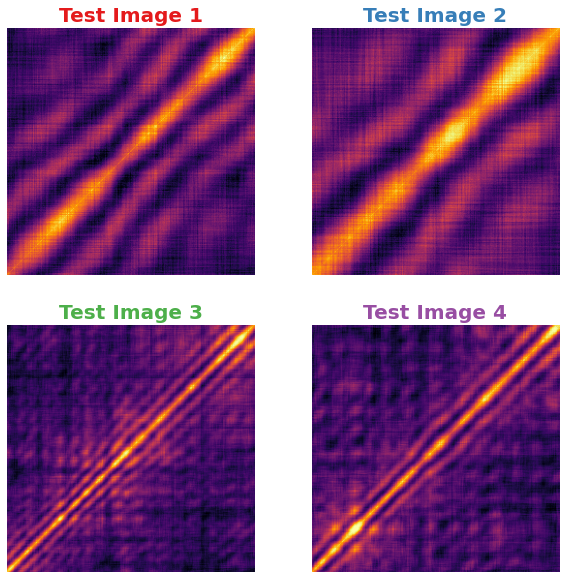

In [9]:
test_image = [465,315,607,657]

n_rows = 2
n_cols = 2

colors = plt.cm.Set1(np.linspace(0,1,9))

fig = plt.figure(figsize=(10,10))

for i in range(len(test_image)):
    ax = fig.add_subplot(n_rows,n_cols,i+1)
    ax.imshow(rheo_images[test_image[i]],image_cmap,origin='lower')
    ax.set_title('{}'.format('Test Image {}'.format(i+1)),color=colors[i],fontsize=20,fontweight='bold')
    ax.axis('off')
    
#fig.savefig('figures/SimilarityTargetImages.png')
#fig.savefig('figures/SimilarityTargetImages.svg')
#fig.savefig('new_figures/heterodyne_sample_images.svg')

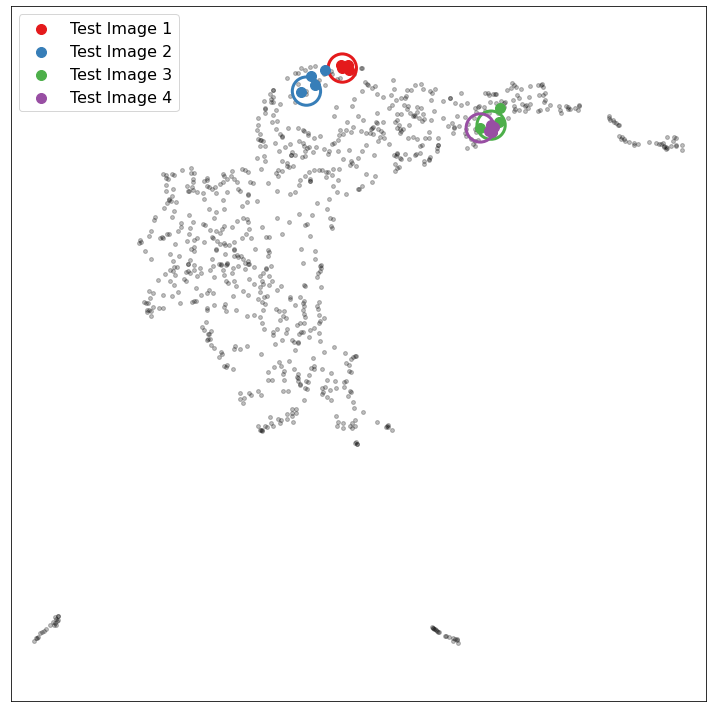

In [10]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(embedding[:,0],embedding[:,1],s=15,color='black',alpha=0.25)

n_neighbors = 4

for i in range(len(test_image)):
#    if i > 0:
#        break
    
    d = np.linalg.norm(rheo_encoded-rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    ax.scatter(embedding[d_sorted[1:n_neighbors+1],0],embedding[d_sorted[1:n_neighbors+1],1],color=colors[i],s=100,label='Test Image {}'.format(i+1))   
    ax.scatter(embedding[test_image[i],0],embedding[test_image[i],1],facecolor=[],edgecolor=colors[i],linewidth=3,s=800)


#ax.set_title('umap projection',fontsize=20)
ax.axis('equal')
ax.set_xticks([])
ax.set_yticks([])
ax.legend(fontsize=16)

fig.tight_layout()
#fig.savefig('figures/SimailarityTargetImages_UMAP.png')
#fig.savefig('figures/SimailarityTargetImages_UMAP.svg')

#fig.savefig('new_figures/TestImageVis.svg')

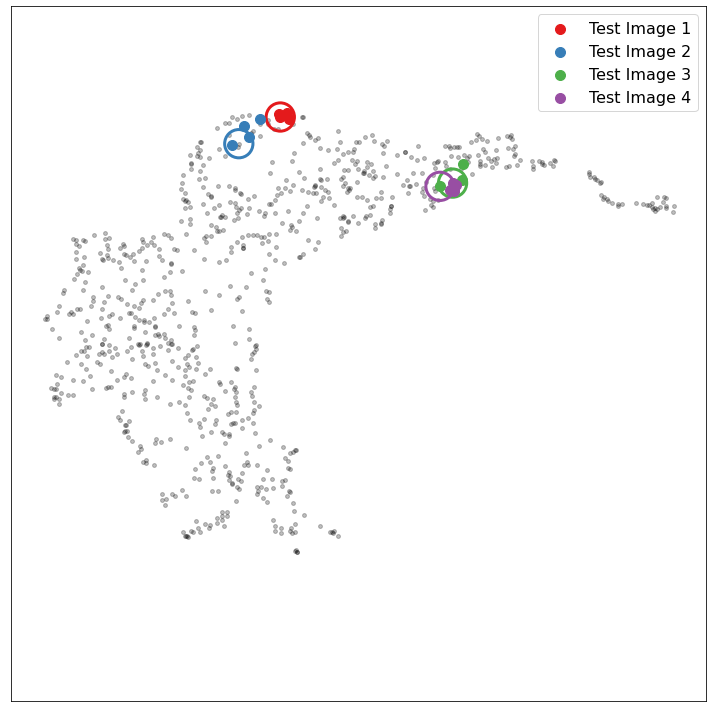

In [11]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(embedding[:,0],embedding[:,1],s=15,color='black',alpha=0.25)

n_neighbors = 4

for i in range(len(test_image)):
#    if i > 0:
#        break
    
    d = np.linalg.norm(rheo_encoded-rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    ax.scatter(embedding[d_sorted[1:n_neighbors+1],0],embedding[d_sorted[1:n_neighbors+1],1],color=colors[i],s=100,label='Test Image {}'.format(i+1))   
    ax.scatter(embedding[test_image[i],0],embedding[test_image[i],1],facecolor=[],edgecolor=colors[i],linewidth=3,s=800)


#ax.set_title('umap projection',fontsize=20)
ax.axis('equal')
ax.set_xlim([-1,18])
ax.set_ylim([2,15])
ax.set_xticks([])
ax.set_yticks([])
ax.legend(fontsize=16)

fig.tight_layout()
#fig.savefig('figures/SimailarityTargetImages_UMAP_crop.png')
#fig.savefig('figures/SimailarityTargetImages_UMAP_crop.svg')



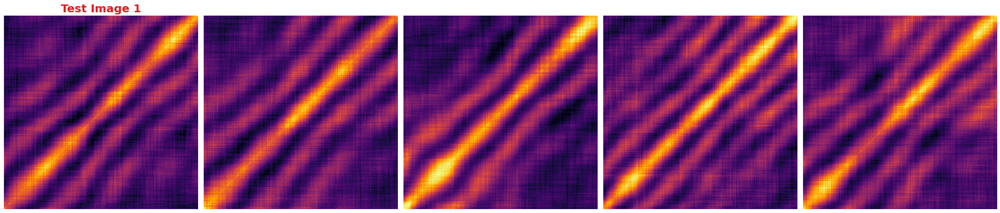

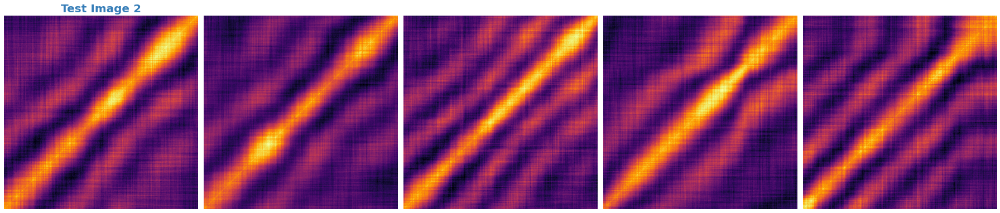

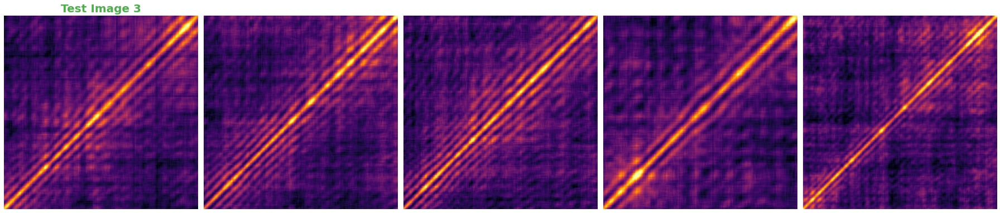

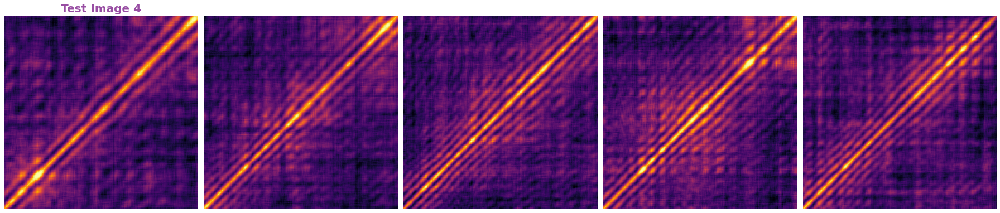

In [12]:
n_rows = 1
n_cols = 5

colors = plt.cm.Set1(np.linspace(0,1,9))

for i in range(len(test_image)):
    
    fig = plt.figure(figsize=(25,8))
    
    test_ax = fig.add_subplot(n_rows,n_cols,1)
    test_ax.imshow(rheo_images[test_image[i]],image_cmap,origin='lower')
    test_ax.axis('off')
    test_ax.set_title('{}'.format('Test Image {}'.format(i + 1)),fontsize=20,fontweight='bold',color=colors[i])
    
    d = np.linalg.norm(rheo_encoded-rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    n = np.random.choice(np.arange(1,100),size=(4))
    
    for j in range(len(n)):
        ax = fig.add_subplot(n_rows,n_cols,j + 2)
        ax.imshow(rheo_images[d_sorted[j+1]],image_cmap,origin='lower')
        #ax.imshow(rheo_images[d_sorted[n[j]]],plt.cm.jet,origin='lower')
        ax.axis('off')
        #ax.set_title('ind: {}, distance: {:.2f}'.format(d_sorted[n[j]],d[d_sorted[n[j]]]))
        #ax.set_title('ind: {}, distance: {:.2f}'.format(d_sorted[j+1],d[d_sorted[j+1]]))
    plt.tight_layout()
#    fig.savefig('new_figures/Neighbors_Test{}_notitle.svg'.format(i+1))
#    fig.savefig('figures/SimilarityOutput_Target{}.png'.format(i+1))
#    fig.savefig('figures/SimilarityOutput_Target{}.svg'.format(i+1))

This works very well for $C_2$ showing this type of fringed pattern, however it is important to note that data which is very unique will have fewer neighbors, or neighbors will occur at further distances in the latent space.

We envision using this technique for data exploration - to identify main trends in the dataset, and understand how the structure of the latent representation relates to real data.

808


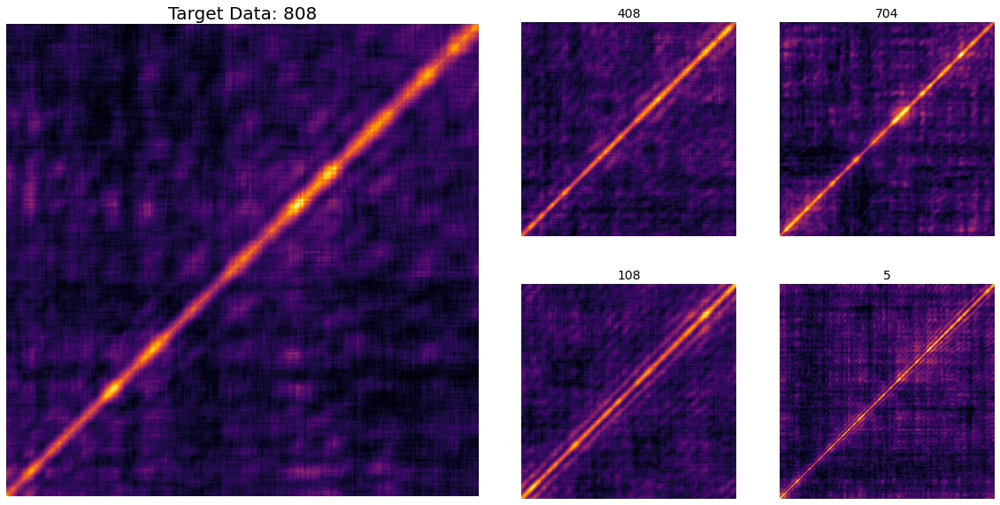

In [13]:
r = np.random.choice(np.arange(len(rheo_images)),replace=False) #380, 631, 883
print(r)

fig = plt.figure(figsize=(20,10))
spec = fig.add_gridspec(2,4)

ax0 = fig.add_subplot(spec[:2,:2])
ax0.imshow(rheo_images[r],plt.cm.inferno,origin='lower')
ax0.axis('off')
ax0.set_title('Target Data: {}'.format(r),fontsize=20)

d = np.linalg.norm(rheo_encoded - rheo_encoded[r],axis=1)
d_sort = np.argsort(d)

n = 1
for row in range(2):
    for col in range(2,4):
        ax = fig.add_subplot(spec[row,col])
        ax.imshow(rheo_images[d_sort[n]],plt.cm.inferno,origin='lower')
        ax.set_title('{}'.format(d_sort[n]),fontsize=14)
        ax.axis('off')
        n += 1
        
#fig.savefig('figures/Similarity_BadResults_{}.png'.format(r))
#fig.savefig('figures/Similarity_BadResults_{}.svg'.format(r))

## Application: Matching Rheology with $C_2$ Clusters

Rheo-XPCS experiments allow us to measure bulk-scale properties (shear stress/viscosity), and microscopic dynamics (via XPCS) at the same time. 

Here we will match the time scales of rheological and XPCS measuremnts to correlate XPCS dynamics directly with non-monotonic shear stress changes during relaxation.


The first step is to determine the dynamics at each experimental time step.  As XPCS correlations are calculated in a variety of portions of the x-ray scattering data, we have multiple $C_2$ describing each time step.  This allows us to have a statistical distribution of dynamics measuremnts at each point.

Based on this plot, peaks of dark green-blue dynamics correspond with the area between minima/maxima in shear stress.  This suggests that slow dynamics, and potentially the occurence of jamming in the colloidal structure, cause the build up of stress in the system.

Visualizations of samples from each class are shown to reiterate that low cluster numbers (blue-green) correspond to slow dynamics, while high cluster numbers (yellow) show fast dynamics

In [14]:
counts = np.zeros((len(np.unique(rheo_times)),len(unique_clusters)))
percents = np.zeros_like(counts)
n = 0

t_range = np.unique(rheo_times)
minima = argrelextrema(np.array(rheo_data['shear_stress']),np.less,order=20)

for t in np.unique(rheo_times):
    t_ind = np.where(rheo_times[:] == t)[0]
    t_clusters = cluster_labels_1[t_ind]
    
    for j in range(counts.shape[1]):
        counts[n,j] = len(t_clusters[t_clusters[:] == j])
    
    n += 1
        
percents = counts / np.sum(counts,axis=1).reshape(-1,1)

In [15]:
cluster_sectors = np.zeros((18,50))

times = np.unique(rheo_times)

for i in range(len(times)):
    ind = np.where(rheo_times[:] == times[i])[0]
    for j in np.arange(1,19):
        index = ind[rheo_sectors[ind] == j]
        cluster_sectors[j-1,i] = cluster_labels_1[index]

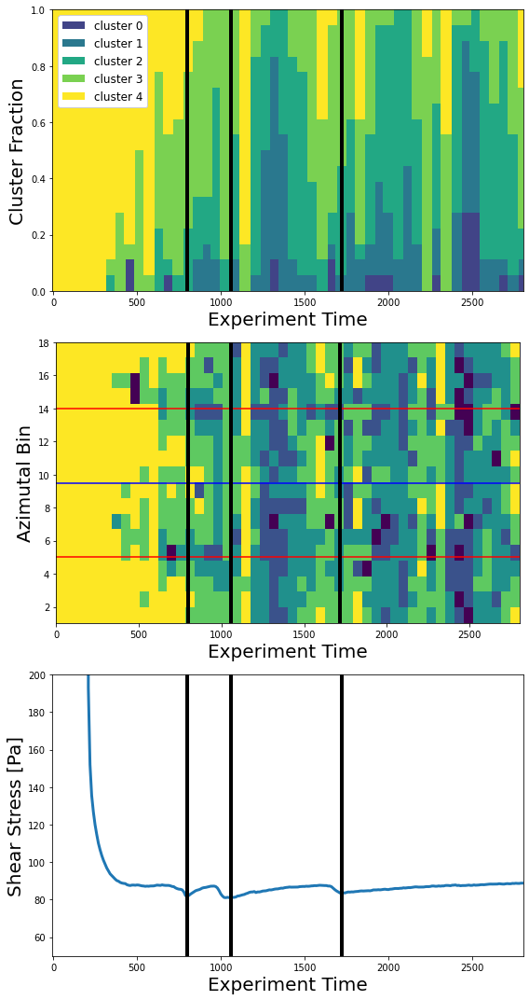

In [16]:
minima = argrelextrema(np.array(rheo_data['shear_stress']),np.less,order=20)

#image_cmap = plt.cm.plasma

fig, ax = plt.subplots(figsize=(8,15),nrows=3)

t_range = np.unique(rheo_times)
#colors = plt.cm.hot(np.linspace(0.2,1,6))
colors = plt.cm.viridis(np.linspace(0.2,1,5))
bar_width = 65
n = 0



for i in range(percents.shape[1]):
    ax[0].bar(t_range,percents[:,i],bottom=np.sum(percents[:,:i],axis=1),width=bar_width,color=colors[n])
    n += 1
    
ax[0].legend(['cluster 0','cluster 1','cluster 2','cluster 3','cluster 4','cluster 5'],framealpha=1,fontsize=12,loc='upper left')
ax[0].set_ylim([0,1.])
ax[0].set_xlim([np.min(t_range),np.max(t_range)])
ax[0].vlines(rheo_data['time'].iloc[minima[0][3:]],0,1.1,colors=['black'],linewidth=4)
ax[0].set_xlabel('Experiment Time',fontsize=20)
ax[0].set_ylabel('Cluster Fraction',fontsize=20)

ax[1].imshow(cluster_sectors,plt.cm.viridis,origin='lower',extent=[0,np.max(t_range),1,18],aspect=100)
ax[1].set_xlabel('Experiment Time',fontsize=20)
ax[1].set_ylabel('Azimutal Bin',fontsize=20)
ax[1].hlines([5,14,9.5],0,np.max(t_range),colors=['red','red','blue'])
ax[1].vlines(rheo_data['time'].iloc[minima[0][3:]],1,18,colors='black',linewidth=4)

ax[2].plot(rheo_data['time'],rheo_data['shear_stress'],linewidth=3)
ax[2].set_ylim([50,200])
ax[2].set_xlim([np.min(t_range),np.max(t_range)])
ax[2].vlines(rheo_data['time'].iloc[minima[0][3:]],0,200,colors=['black'],linewidth=4)
ax[2].set_xlabel('Experiment Time',fontsize=20)
ax[2].set_ylabel('Shear Stress [Pa]',fontsize=20)

fig.tight_layout()
#fig.savefig('figures/Rheo_Analysis_withAzData.png')
#fig.savefig('figures/Rheo_Analysis_withAzData.svg')

In [17]:
#flow = [1,9,10,18]
#not_flow = [4,5,6,13,14,15]
not_flow = [1,2,8,9,10,11,17,18]
flow = [3,4,5,6,7,12,13,14,15,16]
print(len(flow),len(not_flow))

10 8


In [18]:
flow_ind = []
vort_ind = []

for i in range(len(rheo_sectors)):
    if rheo_sectors[i] in flow:
        flow_ind.append(i)
    else:
        if rheo_sectors[i] in not_flow:
            vort_ind.append(i)
        
print(len(flow_ind),len(vort_ind),len(flow_ind)+len(vort_ind))

500 400 900


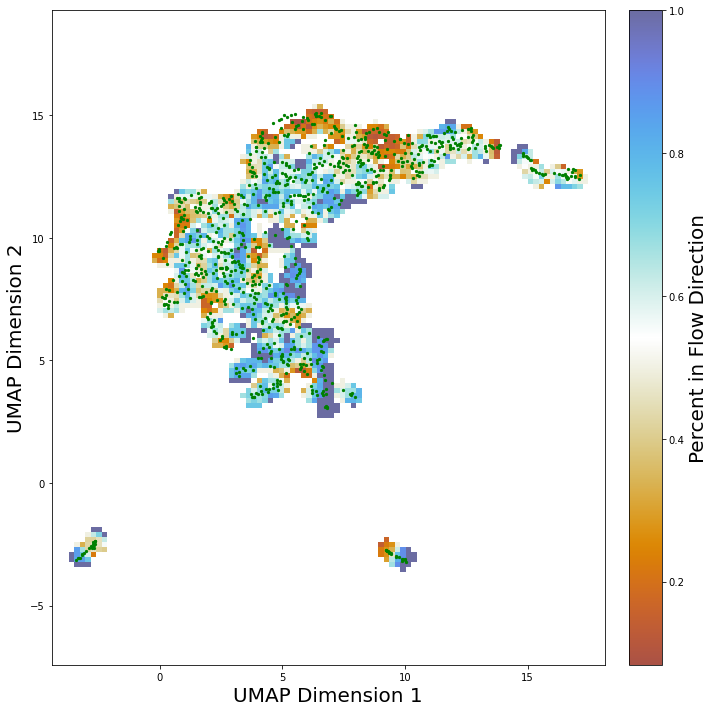

In [34]:
x_vals = np.linspace(np.min(embedding[:,0])-1,np.max(embedding[:,0])+1,100)
y_vals = np.linspace(np.min(embedding[:,1])-1,np.max(embedding[:,1])+1,100)

dx, dy = x_vals[1]-x_vals[0], y_vals[1] - y_vals[0]

angle_map = np.zeros((len(x_vals),len(y_vals)))
density_map = np.zeros_like(angle_map)

xx, yy = np.meshgrid(x_vals,y_vals)
n = 0

for i in range(len(x_vals)):
    for j in range(len(y_vals)):
        dist = np.sqrt((embedding[:,0] - x_vals[i]) ** 2 + (embedding[:,1] - y_vals[j]) ** 2)
        in_range = np.where(dist[:] <= 2 * dx)[0]
        
        density_map[j,i] = len(in_range)
        angles = rheo_sectors[in_range]
        f = 0
        for k in angles:
            if k in flow:
                f += 1
        if len(angles) > 1:
            angle_map[j,i] = f / len(angles)
        else: 
            continue
            
angle_map_bkgd = angle_map.copy()
angle_map_bkgd[angle_map_bkgd[:,:] == 0] = np.nan

fig, ax = plt.subplots(figsize=(10,10))
#g = ax.contourf(xx,yy,angle_map_bkgd,cmap='seismic',levels=50)
g = ax.imshow(angle_map_bkgd,cmr.prinsenvlag,alpha=1,origin='lower',extent=[np.min(x_vals),np.max(x_vals),np.min(y_vals),np.max(y_vals)])
ax.scatter(embedding[:,0],embedding[:,1],s=5,color='g',)
cbar = fig.colorbar(g,ax=ax,fraction=0.06,pad=0.04)
cbar.set_label('Percent in Flow Direction',fontsize=20)
ax.set_xlabel('UMAP Dimension 1',fontsize=20)
ax.set_ylabel('UMAP Dimension 2',fontsize=20)
ax.axis('equal')
fig.tight_layout()

#ax.scatter(embedding[test_image,0],embedding[test_image,1],color='k',s=100)
#fig.savefig('figures/bin_percentage_latentspace.png')
#fig.savefig('figures/bin_percentage_latentspace.svg')

cluster 0: n = 23
cluster 1: n = 115
cluster 2: n = 259
cluster 3: n = 254
cluster 4: n = 249


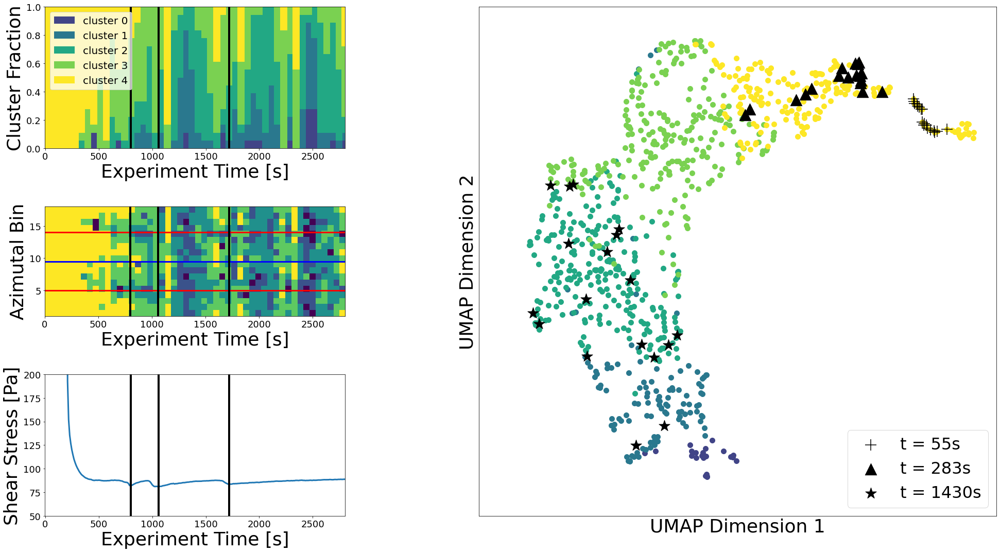

In [21]:
minima = argrelextrema(np.array(rheo_data['shear_stress']),np.less,order=20)

#image_cmap = plt.cm.plasma

fig = plt.figure(figsize=(30,15))
spec = fig.add_gridspec(7,10)

ax0 = fig.add_subplot(spec[:2,:3])
ax1 = fig.add_subplot(spec[2:5,:3])
ax2 = fig.add_subplot(spec[5:,:3])
ax3 = fig.add_subplot(spec[:,4:9])

t_range = np.unique(rheo_times)
#colors = plt.cm.hot(np.linspace(0.2,1,6))
colors = plt.cm.viridis(np.linspace(0.2,1,5))
bar_width = 65
n = 0

fsize=36

for i in range(percents.shape[1]):
    ax0.bar(t_range,percents[:,i],bottom=np.sum(percents[:,:i],axis=1),width=bar_width,color=colors[n])
    n += 1
    
ax0.legend(['cluster 0','cluster 1','cluster 2','cluster 3','cluster 4','cluster 5'],framealpha=0.75,fontsize=20,loc='upper left')
ax0.set_ylim([0,1.])
ax0.set_xlim([np.min(t_range),np.max(t_range)])
ax0.vlines(rheo_data['time'].iloc[minima[0][3:]],0,1.1,colors=['black'],linewidth=4)
ax0.set_xlabel('Experiment Time [s]',fontsize=fsize)
ax0.set_ylabel('Cluster Fraction',fontsize=fsize)
ax0.tick_params(axis='both', labelsize=18)

ax1.imshow(cluster_sectors,plt.cm.viridis,origin='lower',extent=[0,np.max(t_range),1,18],aspect=60)
ax1.set_xlabel('Experiment Time [s]',fontsize=fsize)
ax1.set_ylabel('Azimutal Bin',fontsize=fsize)
ax1.hlines([5,14,9.5],0,np.max(t_range),colors=['red','red','blue'],linewidth=3)
ax1.vlines(rheo_data['time'].iloc[minima[0][3:]],1,18,colors='black',linewidth=4)
ax1.tick_params(axis='both', labelsize=18)

ax2.plot(rheo_data['time'],rheo_data['shear_stress'],linewidth=3)
ax2.set_ylim([50,200])
ax2.set_xlim([np.min(t_range),np.max(t_range)])
ax2.vlines(rheo_data['time'].iloc[minima[0][3:]],0,200,colors=['black'],linewidth=4)
ax2.set_xlabel('Experiment Time [s]',fontsize=fsize)
ax2.set_ylabel('Shear Stress [Pa]',fontsize=fsize)
ax2.tick_params(axis='both', labelsize=18)

colors = plt.cm.viridis(np.linspace(0.2,1,5))
n1 = 0
unique_labels = np.unique(cluster_labels_1)
for i in unique_labels:
    data_umap = embedding[cluster_labels_1[:] == i]
    
    print('cluster {}: n = {}'.format(i,len(data_umap)))
    ax3.scatter(data_umap[:,0],data_umap[:,1],color=colors[i],s=100)#,label='Cluster {}'.format(np.unique(cluster_labels)[i]))

    n1 += 1
    
ts = [55, 283, 1430]
ms = ['+','^','*']
for i in range(len(ts)):
    ax3.scatter(embedding[rheo_times[:] == ts[i],0],embedding[rheo_times[:] == ts[i],1],color='black',marker=ms[i],s=500,label='t = {}s'.format(ts[i]))
    
    
ax3.legend(fontsize=32,loc='lower right')

#ax.axis('equal')
ax3.set_xticks([])
ax3.set_yticks([])
ax3.set_ylim([2,16])
ax3.set_xlim([-2,18])
#
ax3.set_xlabel('UMAP Dimension 1',fontsize=36)
ax3.set_ylabel('UMAP Dimension 2',fontsize=36)

#g = ax3.imshow(angle_map_bkgd,plt.cm.coolwarm,alpha=1,origin='lower',extent=[np.min(x_vals),np.max(x_vals),np.min(y_vals),np.max(y_vals)])
#ax3.scatter(embedding[:,0],embedding[:,1],s=10,color='g',)
#cbar = fig.colorbar(g,ax=ax3,fraction=0.06,pad=0.04)
#cbar.set_label('Percent in Flow Direction',fontsize=fsize)
#ax3.set_xlabel('UMAP Dimension 1',fontsize=fsize)
#ax3.set_ylabel('UMAP Dimension 2',fontsize=fsize)
#ax3.axis('equal')
#ax3.tick_params(axis='both', labelsize=18)
#cbar.ax.tick_params(labelsize=18) 
##cbar.ax.set_yticklabels([0,0.25,0.5,0.75,1])

fig.tight_layout()
#fig.savefig('../../XPCS_Clustering/figures/Rheo_Analysis_withAzData_latent.png')
#fig.savefig('../../XPCS_Clustering/figures/Rheo_Analysis_withAzData_latent.svg')

# Evaluating the impact of Machine Learning on Data Encoding and Analysis

Deep-learning (DL) models, such as the unsupervised autoencoder used here, are complex models that can be difficult to intpret.  In some cases, simpler and more intuitive models will also work, so it is important to motivate the use of DL by showing the improvement over simpler analysis/processing methods.

In this case, it is possible to perform similar analyses (UMAP projection, clustering, similarity measurement, and time-resolved analysis) on the raw $C_2$ data by transforming the data from a 256 x 256-pixel "image" to a vector with shape $256^2$ x 1.  From here, clustering and analysis algorithms can be applied as usual to compare with our DL solution.


We will start by showing the UMAP embedding of the Latent space and the raw data side by side.

In [43]:
start = time.time()
reducer_encoded = UMAP(n_components=2,n_neighbors=5,min_dist=0.25,metric='euclidean')
embedding_encoded = reducer_encoded.fit_transform(rheo_encoded)
print('UMAP encoded: {} s'.format(time.time() - start))

start = time.time()
reducer_raw = UMAP(n_components=2,n_neighbors=5,min_dist=0.25,metric='euclidean')
embedding_raw = reducer_raw.fit_transform(rheo_raw)
print('UMAP raw: {} s'.format(time.time() - start))

UMAP encoded: 1.1727509498596191 s
UMAP raw: 7.9636359214782715 s


First, we notice that for this dataset (which contains 900 $C_2$, and is relatively small for XPCS experiments), the time to calculate the UMAP embedding of the raw dataset is more than 7 times greater than that for the ML-encoded dataset.  The computation time will increase exponentially as more data is added, making UMAP embedding infeasible for large datasets.

Text(0.5, 1.0, 'Raw Data')

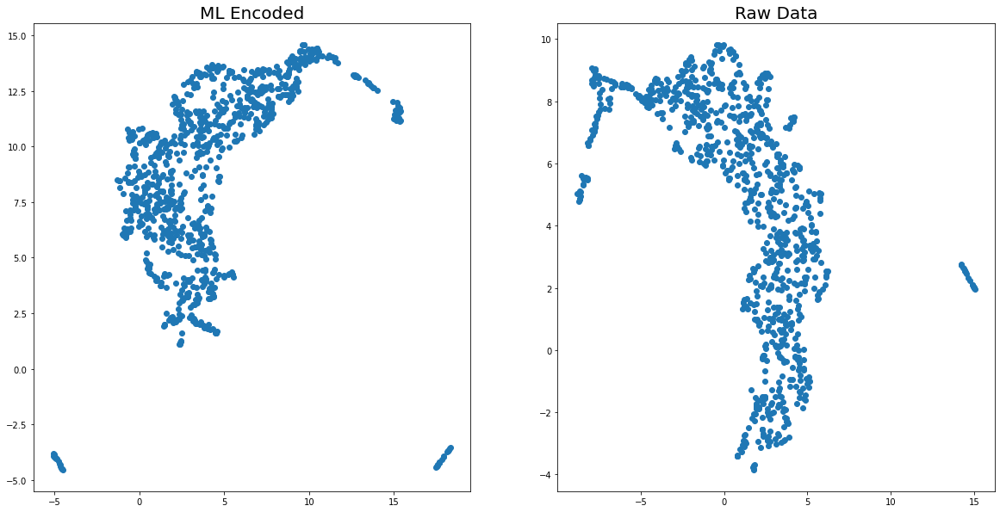

In [44]:
fig, ax = plt.subplots(figsize=(20,10),ncols=2)
ax[0].scatter(embedding_encoded[:,0],embedding_encoded[:,1])
ax[0].set_title('ML Encoded',fontsize=20)

ax[1].scatter(embedding_raw[:,0],embedding_raw[:,1])
ax[1].set_title("Raw Data",fontsize=20)

#fig.savefig('figures/ML_Comparison/PlainUMAP.png')
#fig.savefig('figures/ML_Comparison/PlainUMAP.svg')

Secondly, the appearance of both projections is very similar.  This suggests that the dominant data feature in both the encoded and raw datasets is the same.  Since our previous analysis shows that the clusters are overall defined by the width and intensity of the correlation along the diagonal, we presume that the main feature that is seen by processing algorithms is the mean intensity of the $C_2$.  This is the same regardless of processing steps, so it makes sense why the results are similar.

In the next steps, we will perform KMeans clustering on both datasets and compare samples from each cluster.

Clustering time for ML dataset: 0.1342909336090088 s
Clustering time for Raw dataset: 6.544717073440552 s


Text(0.5, 1.0, 'Raw Data')

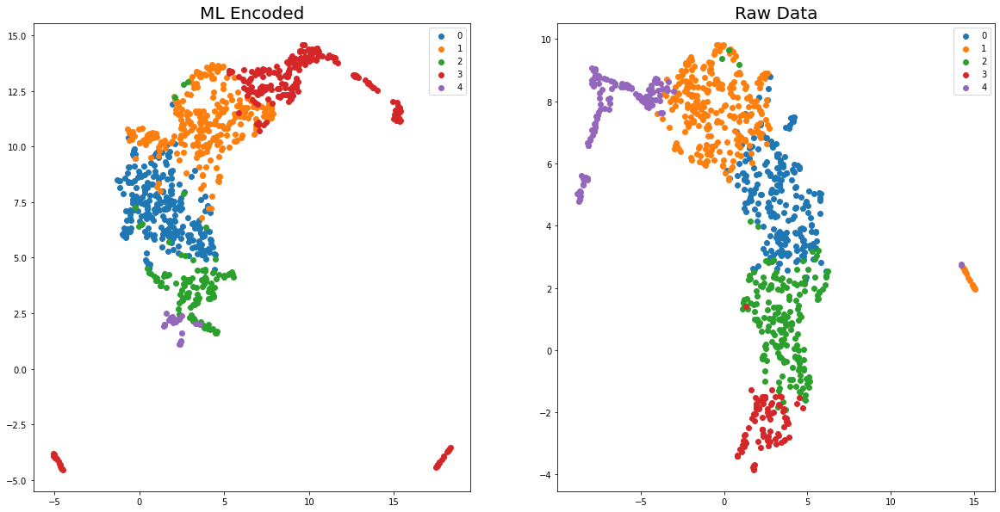

In [45]:
start = time.time()
kmeans_encoded = KMeans(n_clusters=5)
cluster_labels_encoded = kmeans_encoded.fit_predict(rheo_encoded)
print('Clustering time for ML dataset: {} s'.format(time.time() - start))

start = time.time()
kmeans_raw = KMeans(n_clusters=5)
cluster_labels_raw = kmeans_raw.fit_predict(rheo_raw)
print('Clustering time for Raw dataset: {} s'.format(time.time() - start))

fig, ax = plt.subplots(figsize=(20,10),ncols=2)

for i in range(5):
    ax[0].scatter(embedding_encoded[cluster_labels_encoded[:] == i,0],embedding_encoded[cluster_labels_encoded[:] == i,1],label=i)
    ax[1].scatter(embedding_raw[cluster_labels_raw[:] == i,0],embedding_raw[cluster_labels_raw[:] == i,1],label=i)

ax[0].legend()
ax[1].legend()

ax[0].set_title('ML Encoded',fontsize=20)
ax[1].set_title("Raw Data",fontsize=20)

In [ ]:
cluster_labels_encoded_1 = cluster_labels_encoded.copy()
cluster_labels_raw_1 = cluster_labels_raw.copy()

cluster_labels_encoded_1[cluster_labels_encoded[:] == 0] = 3
cluster_labels_encoded_1[cluster_labels_encoded[:] == 1] = 1
cluster_labels_encoded_1[cluster_labels_encoded[:] == 2] = 2
cluster_labels_encoded_1[cluster_labels_encoded[:] == 3] = 0
cluster_labels_encoded_1[cluster_labels_encoded[:] == 4] = 4

cluster_labels_raw_1[cluster_labels_raw[:] == 0] = 4
cluster_labels_raw_1[cluster_labels_raw[:] == 1] = 0
cluster_labels_raw_1[cluster_labels_raw[:] == 2] = 2
cluster_labels_raw_1[cluster_labels_raw[:] == 3] = 1
cluster_labels_raw_1[cluster_labels_raw[:] == 4] = 3

colors = plt.cm.viridis(np.linspace(0.2,1,5))

fig, ax = plt.subplots(figsize=(20,10),ncols=2)

for i in range(5):
    ax[0].scatter(embedding_encoded[cluster_labels_encoded_1[:] == i,0],embedding_encoded[cluster_labels_encoded_1[:] == i,1],color=colors[i],label=i)
    ax[1].scatter(embedding_raw[cluster_labels_raw_1[:] == i,0],embedding_raw[cluster_labels_raw_1[:] == i,1],color=colors[i],label=i)

ax[0].legend()
ax[1].legend()

ax[0].set_title('ML Encoded',fontsize=20)
ax[1].set_title("Raw Data",fontsize=20)

#fig.savefig('figures/ML_Comparison/ClusterUMAP.png')
#fig.savefig('figures/ML_Comparison/ClusterUMAP.svg')

One thing to notices is that the clusters overlap more in the ML-encoded dataset than in the raw dataset.  While in both cases it is perhaps incorrect to think of dynamcis in terms of distinct clusters since the data represents a continous transition in dynamics rather than discrete jumps in behavior, the overlap in clusters in this reduced space (for ML, clustering is performed in 64-dimensional space, while for the raw data clustering is in $256^2$-dimensions) suggests that the ML model represents more complex relationships between data than the 2D UMAP projection can show.  This problem is not seen to the same degree in the Raw data, showing that th main feature for clustering is mean image intensity.

In [ ]:
for i in range(5):
    fig, ax = plt.subplots(figsize=(20,10),ncols=2)
    ax[0].set_title('ML Encoded',fontsize=20)
    ax[1].set_title("Raw Data",fontsize=20)
    
    ax[0].imshow(rheo_images[np.random.choice(np.where(cluster_labels_encoded_1[:] == i)[0],replace=False)],plt.cm.inferno,origin='lower')
    ax[1].imshow(rheo_images[np.random.choice(np.where(cluster_labels_raw_1[:] == i)[0],replace=False)],plt.cm.inferno,origin='lower')
    fig.suptitle('Cluster # {}'.format(i),fontsize=36)
    
#    fig.savefig('figures/ML_Comparison/ClusterSamples_Cluster{}.png'.format(i))
#    fig.savefig('figures/ML_Comparison/ClusterSamples_Cluster{}.svg'.format(i))

Random samples from both processing methods show similar appearance.  Low cluster numbers correspond to slow dyanmics, higher numbers show faster dynamics.

In [ ]:
t_range = np.unique(rheo_times)
minima = argrelextrema(np.array(rheo_data['shear_stress']),np.less,order=20)

unique_clusters_ml = np.unique(cluster_labels_encoded_1)
unique_clusters_raw = np.unique(cluster_labels_raw_1)




fig, ax = plt.subplots(figsize=(15,30),nrows=3)

ax[0].plot(rheo_data['time'],rheo_data['shear_stress'],linewidth=3)
ax[0].set_ylim([50,200])
ax[0].set_xlim([np.min(t_range),np.max(t_range)])
ax[0].vlines(rheo_data['time'].iloc[minima[0][3:]],0,200,colors=['black'],linewidth=4)
ax[0].set_xlabel('Experiment Time',fontsize=16)
ax[0].set_ylabel('Shear Stress [Pa]',fontsize=16)




### Calculate dynamics percentages for ML encoding
counts_ml = np.zeros((len(np.unique(rheo_times)),len(unique_clusters_ml)))
percents_ml = np.zeros_like(counts_ml)
n = 0

for time in np.unique(rheo_times):
    t_ind = np.where(rheo_times[:] == time)[0]
    t_clusters = cluster_labels_encoded_1[t_ind]
    
    for j in range(counts_ml.shape[1]):
        counts_ml[n,j] = len(t_clusters[t_clusters[:] == j])
    
    n += 1
        
percents_ml = counts_ml / np.sum(counts_ml,axis=1).reshape(-1,1)

colors=plt.cm.viridis(np.linspace(0.2,1,5))
bar_width=65
n = 0

for i in range(percents_ml.shape[1]):
    ax[1].bar(t_range,percents_ml[:,i],bottom=np.sum(percents_ml[:,:i],axis=1),width=bar_width,color=colors[n])
    n += 1
    
ax[1].legend(['class 0','class 1','class 2','class 3','class 4','class 5'],framealpha=1,fontsize=12,loc='upper left')
ax[1].set_ylim([0,1.])
ax[1].set_xlim([np.min(t_range),np.max(t_range)])
ax[1].vlines(rheo_data['time'].iloc[minima[0][3:]],0,1.1,colors=['black'],linewidth=4)
ax[1].set_xlabel('Experiment Time',fontsize=16)
ax[1].set_ylabel('Class Fraction',fontsize=16)

ax[1].set_title("ML Encoding",fontsize=20)




### Calculate dynamics percentages for Raw Data
counts_raw = np.zeros((len(np.unique(rheo_times)),len(unique_clusters_raw)))
percents_raw = np.zeros_like(counts_raw)
n = 0

for time in np.unique(rheo_times):
    t_ind = np.where(rheo_times[:] == time)[0]
    t_clusters = cluster_labels_raw_1[t_ind]
    
    for j in range(counts_raw.shape[1]):
        counts_raw[n,j] = len(t_clusters[t_clusters[:] == j])
    
    n += 1
        
percents_raw = counts_raw / np.sum(counts_raw,axis=1).reshape(-1,1)

n = 0

for i in range(percents_raw.shape[1]):
    ax[2].bar(t_range,percents_raw[:,i],bottom=np.sum(percents_raw[:,:i],axis=1),width=bar_width,color=colors[n])
    n += 1
    
ax[2].legend(['class 0','class 1','class 2','class 3','class 4','class 5'],framealpha=1,fontsize=12,loc='upper left')
ax[2].set_ylim([0,1.])
ax[2].set_xlim([np.min(t_range),np.max(t_range)])
ax[2].vlines(rheo_data['time'].iloc[minima[0][3:]],0,1.1,colors=['black'],linewidth=4)
ax[2].set_xlabel('Experiment Time',fontsize=16)
ax[2].set_ylabel('Class Fraction',fontsize=16)

ax[2].set_title("Raw Data Analysis",fontsize=20)

#fig.savefig('figures/ML_Comparison/RheoAnalysis.png')
#fig.savefig('figures/ML_Comparison/RheoAnalysis.svg')

Temporal analysis of dynamics gives similar results for both methods.  This is not surprising based on our understanding that the main feature for high-level clustering is mean intensity.  That being said, we note that the Raw Data plot is a bit noisier.  At early times there is significantly higher portion of Cluster 3, which does not make sense, since the material is so far out of equilibrium at this point that there should be almost no correlation between successive SAXS frames.  Moreover, after the t $\approx$ 1000, Clusters 2-3 appear with nearly constant intensity for the duration of the experiment, while the ML-encoding version seems to capture a larger range of fluctuations.

In short, while both analyses show similar results the Raw Data analysis appears less sensitive to changes in dynamics.

In [ ]:
test_image = [465,315,607,657]

fig, ax = plt.subplots(figsize=(20,10),ncols=2)
ax[0].scatter(embedding_raw[:,0],embedding_raw[:,1],s=15,color='black',alpha=0.25)
ax[1].scatter(embedding_encoded[:,0],embedding_encoded[:,1],s=15,color='black',alpha=0.25)

n_neighbors = 4
    
colors = plt.cm.Set1(np.linspace(0,1,9))


for i in range(len(test_image)):
#    if i > 0:
#        break
    
    d = np.linalg.norm(rheo_raw-rheo_raw[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    ax[0].scatter(embedding_raw[d_sorted[1:n_neighbors+1],0],embedding_raw[d_sorted[1:n_neighbors+1],1],color=colors[i],s=100,label='Test Image {}'.format(i+1))   
    ax[0].scatter(embedding_raw[test_image[i],0],embedding_raw[test_image[i],1],facecolor=[],edgecolor=colors[i],linewidth=3,s=800)
        
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].legend(fontsize=16)
ax[0].set_title('Raw Data',fontsize=20)


for i in range(len(test_image)):
#    if i > 0:
#        break
    
    d = np.linalg.norm(rheo_encoded-rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    ax[1].scatter(embedding_encoded[d_sorted[1:n_neighbors+1],0],embedding_encoded[d_sorted[1:n_neighbors+1],1],color=colors[i],s=100,label='Test Image {}'.format(i+1))   
    ax[1].scatter(embedding_encoded[test_image[i],0],embedding_encoded[test_image[i],1],facecolor=[],edgecolor=colors[i],linewidth=3,s=800)
    
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].legend(fontsize=16)
ax[1].set_title('ML Encoding',fontsize=20)

#ax.set_title('UMAP projection',fontsize=20)
#ax.axis('equal')

fig.tight_layout()
#fig.savefig('figures/ML_Comparison/SimlarityTarget_UMAP.png')
#fig.savefig('figures/ML_Comparison/SimlarityTarget_UMAP.svg')

In [ ]:
n_rows = 1
n_cols = 5

colors = plt.cm.Set1(np.linspace(0,1,9))

for i in range(len(test_image)):
    
    fig = plt.figure(figsize=(25,8))
    
    test_ax = fig.add_subplot(n_rows,n_cols,1)
    test_ax.imshow(rheo_images[test_image[i]],image_cmap,origin='lower')
    test_ax.axis('off')
    test_ax.set_title('{}'.format('Test Image {} - ML Encoding'.format(i + 1)),fontsize=20,fontweight='bold',color=colors[i])
    
    d = np.linalg.norm(rheo_encoded-rheo_encoded[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    n = np.random.choice(np.arange(1,100),size=(4))
    
    for j in range(len(n)):
        ax = fig.add_subplot(n_rows,n_cols,j + 2)
        ax.imshow(rheo_images[d_sorted[j+1]],image_cmap,origin='lower')
        #ax.imshow(rheo_images[d_sorted[n[j]]],plt.cm.jet,origin='lower')
        ax.axis('off')
        #ax.set_title('ind: {}, distance: {:.2f}'.format(d_sorted[n[j]],d[d_sorted[n[j]]]))
        #ax.set_title('ind: {}, distance: {:.2f}'.format(d_sorted[j+1],d[d_sorted[j+1]]))
    plt.tight_layout()
#    fig.savefig('figures/ML_Comparison/Similarity_ML_Taret{}.png'.format(i+1))
#    fig.savefig('figures/ML_Comparison/Similarity_ML_Taret{}.svg'.format(i+1))
#    fig.savefig('new_figures/Neighbors_Test{}_notitle.svg'.format(i+1))

In [ ]:
n_rows = 1
n_cols = 5

colors = plt.cm.Set1(np.linspace(0,1,9))

for i in range(len(test_image)):
    
    fig = plt.figure(figsize=(25,8))
    
    test_ax = fig.add_subplot(n_rows,n_cols,1)
    test_ax.imshow(rheo_images[test_image[i]],image_cmap,origin='lower')
    test_ax.axis('off')
    test_ax.set_title('{}'.format('Test Image {} - Raw Data'.format(i + 1)),fontsize=20,fontweight='bold',color=colors[i])
    
    d = np.linalg.norm(rheo_raw-rheo_raw[test_image[i]],axis=1)
    d_sorted = np.argsort(d)
    
    n = np.random.choice(np.arange(1,100),size=(4))
    
    for j in range(len(n)):
        ax = fig.add_subplot(n_rows,n_cols,j + 2)
        ax.imshow(rheo_images[d_sorted[j+1]],image_cmap,origin='lower')
        #ax.imshow(rheo_images[d_sorted[n[j]]],plt.cm.jet,origin='lower')
        ax.axis('off')
        #ax.set_title('ind: {}, distance: {:.2f}'.format(d_sorted[n[j]],d[d_sorted[n[j]]]))
        #ax.set_title('ind: {}, distance: {:.2f}'.format(d_sorted[j+1],d[d_sorted[j+1]]))
    plt.tight_layout()
#    fig.savefig('figures/ML_Comparison/Similarity_Raw_Taret{}.png'.format(i+1))
#    fig.savefig('figures/ML_Comparison/Similarity_Raw_Taret{}.svg'.format(i+1))
#    fig.savefig('new_figures/Neighbors_Test{}_notitle.svg'.format(i+1))

Both methods are able to identify similar data for all test images (noting that the Raw Data method performs significantly worse for Test Images 3-4).  However, the UMAP visualization of the data shows that all samples are further apart for the Raw Data case than in the ML Encoding.
UMAP distances are useful for comparison, but do not have a physical meaning - so direct comparisons between different UMAP embeddings must be taken with caution - however the purpose of the UMAP embedding is to produce a reliable and interpretable representation of the global structure of the dataset.  The fact that similar pairs of target data (1-2, and 3-4, respectively) appear on nearly opposite sides of the distribtuion in the Raw Data case suggests that Raw Data method is not able to represent more subtle changes in the data, such that a large portion of the dataset appears nearly as similar as the nearest neighbors.  This is especially true for the single blue point near the red cluster in the Raw Data UMAP plot - this suggests that similar data can appear at a variety of places across the dataset and that the distribution is unreliable.

# Other Benefits of ML Encoding

## Dataset Sparsity
Related to the previous point, that in the raw data encoding many data points appear similar regardless of their actual characteristics,the sparsity of the dataset (the amount of the latent space which is filled by the data) is significantly increased in the raw data encoding which has a dimensionality of $256^2$ compared to the 64-D ML encoding.

This makes analysis and identification of similar data very difficult due to the well-known "curse of dimensionality" - in higher dimensional representations, the distance between all points diminishes.

In the following plots, we will observe the $1^{st}, 10^{th}$, and $100^{th}$ nearest neighbor distances in both processing methods to understand dataset sparsity.  Ideally, there will be a large difference between the mean nearest neighbor distance and 100th nearest neibhbor distance - otherwise, dissimilar data will appear similar.

In [35]:
### Calculate Distances Between Samples

raw_nn = np.zeros((len(rheo_raw),))
raw_10nn = np.zeros_like(raw_nn)
raw_100nn = np.zeros_like(raw_nn)

for i in tqdm(range(len(rheo_raw))):
    d = np.linalg.norm(rheo_raw - rheo_raw[i],axis=1)
    d_sort = np.argsort(d)
    
    raw_nn[i] = d[d_sort[1]]
    raw_10nn[i] = d[d_sort[10]]
    raw_100nn[i] = d[d_sort[100]]

100%|█████████████████████████████████████████| 900/900 [01:31<00:00,  9.86it/s]


In [36]:
encoded_nn = np.zeros((len(rheo_encoded),))
encoded_10nn = np.zeros_like(raw_nn)
encoded_100nn = np.zeros_like(raw_nn)

for i in tqdm(range(len(rheo_encoded))):
    d = np.linalg.norm(rheo_encoded - rheo_encoded[i],axis=1)
    d_sort = np.argsort(d)
    
    encoded_nn[i] = d[d_sort[1]]
    encoded_10nn[i] = d[d_sort[10]]
    encoded_100nn[i] = d[d_sort[100]]

100%|███████████████████████████████████████| 900/900 [00:00<00:00, 9300.10it/s]


First thing to note is, agian, the difference in processing times for calculating distance between all points in the dataset.

For the raw data in $256^2$-D this calculation takes over 1.5 minutes, while the same operation takes less than a second for the 64-D ML latent representation.  This time difference will grow as the number of samples increases.

In [37]:
## Calculate histogram of nearest neighbor distances

encoded_nn_counts, encoded_nn_edges = np.histogram(encoded_nn,bins='auto')
encoded_nn_centers = (encoded_nn_edges[1:] + encoded_nn_edges[:-1]) / 2

encoded_10nn_counts, encoded_10nn_edges = np.histogram(encoded_10nn,bins='auto')
encoded_10nn_centers = (encoded_10nn_edges[1:] + encoded_10nn_edges[:-1]) / 2

encoded_100nn_counts, encoded_100nn_edges = np.histogram(encoded_100nn,bins='auto')
encoded_100nn_centers = (encoded_100nn_edges[1:] + encoded_100nn_edges[:-1]) / 2




raw_nn_counts, raw_nn_edges = np.histogram(raw_nn,bins='auto')
raw_nn_centers = (raw_nn_edges[1:] + raw_nn_edges[:-1]) / 2

raw_10nn_counts, raw_10nn_edges = np.histogram(raw_10nn,bins='auto')
raw_10nn_centers = (raw_10nn_edges[1:] + raw_10nn_edges[:-1]) / 2

raw_100nn_counts, raw_100nn_edges = np.histogram(raw_100nn,bins='auto')
raw_100nn_centers = (raw_100nn_edges[1:] + raw_100nn_edges[:-1]) / 2

[]

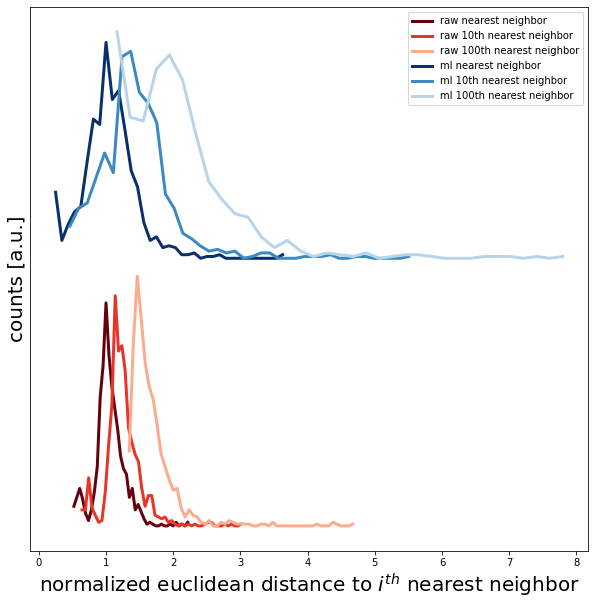

In [38]:
fig, ax = plt.subplots(figsize=(10,10))

colors_raw = plt.cm.Reds_r(np.linspace(0,0.7,3))
raw_nn_max = raw_nn_centers[np.where(raw_nn_counts[:] == np.max(raw_nn_counts[1:]))[0]]
ax.plot(raw_nn_centers[1:] / raw_nn_max,raw_nn_counts[1:],color=colors_raw[0],linewidth=3,label='raw nearest neighbor')
ax.plot(raw_10nn_centers[1:] / raw_nn_max,raw_10nn_counts[1:],color=colors_raw[1],linewidth=3,label='raw 10th nearest neighbor')
ax.plot(raw_100nn_centers[1:] / raw_nn_max,raw_100nn_counts[1:],color=colors_raw[2],linewidth=3,label='raw 100th nearest neighbor')

colors_ml = plt.cm.Blues_r(np.linspace(0,0.7,3))
encoded_nn_max = encoded_nn_centers[np.where(encoded_nn_counts[:] == np.max(encoded_nn_counts[1:]))[0]]
ax.plot(encoded_nn_centers[1:] / encoded_nn_max,encoded_nn_counts[1:] + 150,color=colors_ml[0],linewidth=3,label='ml nearest neighbor')
ax.plot(encoded_10nn_centers[1:] / encoded_nn_max,encoded_10nn_counts[1:] + 150,color=colors_ml[1],linewidth=3,label='ml 10th nearest neighbor')
ax.plot(encoded_100nn_centers[1:] / encoded_nn_max,encoded_100nn_counts[1:] + 150,color=colors_ml[2],linewidth=3,label='ml 100th nearest neighbor')

ax.legend()
ax.set_xlabel(r'normalized euclidean distance to $i^{th}$ nearest neighbor',fontsize=20)
ax.set_ylabel('counts [a.u.]',fontsize=20)
ax.set_yticks([])

#fig.savefig('figures/ML_Comparison/Sparsity_Plot.png')
#fig.savefig('figures/ML_Comparison/Sparsity_Plot.svg')

As shown in the above plot, there is a greater distance between neighbors using the ML encoding, signifying that the ML latent space approach is able express and distiguish a greater variety of $C_2$ patterns than simply by looking at the raw data.  This is important for understanding the structure of an entire dataset - looking at the raw data distances, one might think that a majority of the data is nearly indistinguishable since nearest neighbor and $100^{th}$ nearest neighbor distances are similar.  Alternatively, the distances in ML encoding not only show more separation in the neighbor distances, but the low-distance peaks for the $10^{th}$ and $100^{th}$-nearest neighbor cases suggest that there is a large (but not all-encompassing) portion of the dataset which is actually more similar than the average ($100^{th}$-nearest neighbor occurs at a similar distance to the $10^{th}$ nearest neighbor.

## Generative Capabilities

Since the latent space represents the entire phase space of possible experimental data, new points in the space can be decoded to yeild artificial data.  The key is that this artificial data should be realistic.

Here, we will select target experimetnal data, and use our autoencoder to generate new data which is similar to the target.  New latent vectors are created by adding gaussian noise with a specified standard deviation to each element of the target latent vector.  Adding larger degrees of noise represent further departure from the target, and potentially more unrealistic data.  It is worth noting that this approach of adding independent noise values to each element of the latent representation assumes that each latent variable is independent from the others.  While VAE models attempt to reach this level of independence, our latent variables likely have codependencies - therefore, we should not expect that adding large values of random noise to each element will produce realistic $C_2$.

To this end, we start by measuring the mean standard deviation of each latent variable across the test dataset to identify a realistic noise level.  In the second example we show the results of adding noise much larger than what is seen in the experimetnal data.

In [39]:
#### Get correct weights

decoder_model = recon_decoder(latent_size=64)
decoder_state_dict = decoder_model.state_dict()

checkpoint = torch.load('AutoEncoder/weights/full_dataset_augmented_training_normbest_model_0051.pth',map_location=torch.device('cpu'))

checkpoint['bottleneck.0.weight'] = checkpoint['bottleneck.3.weight']
checkpoint['bottleneck.0.bias'] = checkpoint['bottleneck.3.bias']

pretrained_dict = {k: v for k, v in checkpoint.items() if k in decoder_state_dict}

decoder_model.load_state_dict(pretrained_dict)

<All keys matched successfully>

0.3089230929596378


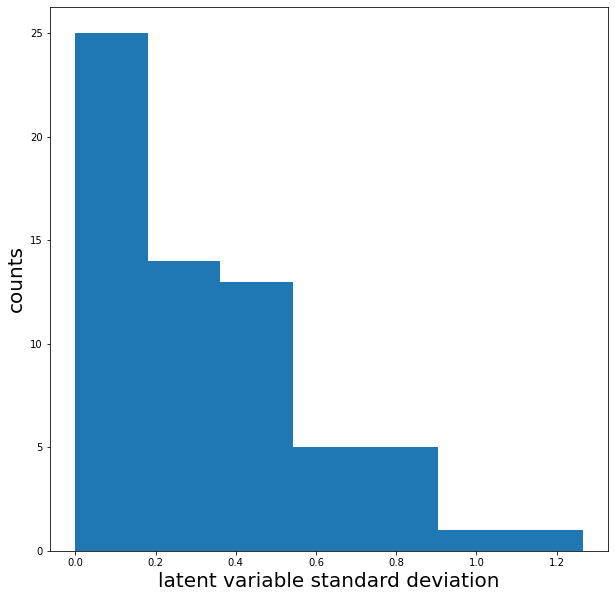

In [40]:
stds = []
for i in range(rheo_encoded.shape[1]):
    stds.append(np.std(rheo_encoded[:,i]))
    
fig, ax = plt.subplots(figsize=(10,10))
ax.hist(stds,bins='auto')
ax.set_xlabel('latent variable standard deviation',fontsize=20)
ax.set_ylabel('counts',fontsize=20)

print(np.mean(stds))

The average standard deviation of latent variables in the test dataset is 0.3 - this will be our starting gaussian $\sigma$ for evaluating generative capabilities.

In the plot below, we generate 16 artificial $C_2$ using gaussian noise with $\sigma = 0.3$.

198


/opt/anaconda3/envs/pytorch/lib/python3.10/site-packages/torch/amp/autocast_mode.py:198: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


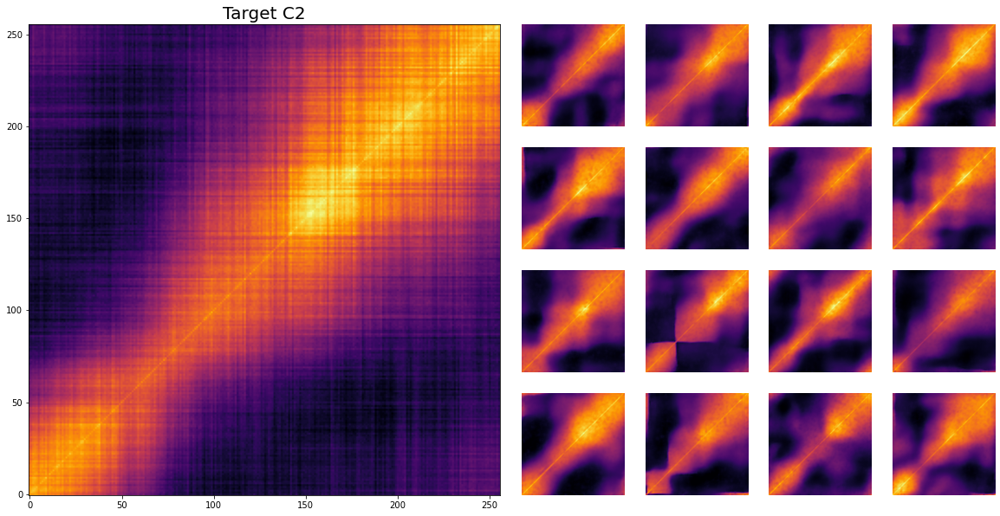

In [41]:
image_index = 198#np.random.choice(np.arange(len(rheo_data)),replace=False)
print(image_index)
#image_index = 863, 557, 380, 415, 154, 381, 201, 19
test_image = rheo_images[image_index]
test_encoding = rheo_encoded[image_index]

noise_level = 0.3
n_samples = 16

shifts = np.random.normal(scale=noise_level,size=(n_samples,rheo_encoded.shape[1]))
shifted_encoding = test_encoding + shifts
shifted_C2 = decoder_model(torch.tensor(shifted_encoding.reshape(-1,64),dtype=torch.float)).detach().cpu().numpy().squeeze()



fig = plt.figure(figsize=(20,10))
spec = fig.add_gridspec(4,8)

ax0 = fig.add_subplot(spec[:4,:4])
ax0.imshow(test_image,plt.cm.inferno,origin='lower')
ax0.set_title("Target C2",fontsize=20)
#ax0.axis('off')

n = 0
for row in range(4):
    for column in range(4,8):
        ax = fig.add_subplot(spec[row,column])
        ax.imshow(shifted_C2[n],plt.cm.inferno,origin='lower')
        ax.axis('off')
        n += 1
        
#fig.savefig('figures/ML_Comparison/Generative_Target{}_Noise0p3_1.png'.format(image_index))
#fig.savefig('figures/ML_Comparison/Generative_Target{}_Noise0p3_1.svg'.format(image_index))

Overall, artificial data generate with this reasonable noise level appear similar to the target data.  All have a narrow region of correlation in te first quarter of the experiment and gradual broadening afterwards.  Most even reproduce the low correlation intensity seen in the upper left and lower right corners of the Target $C_2$.

Below, we will investigate how generate qualities change as a function of noise level.

198


NameError: name 'reducer_encoded' is not defined

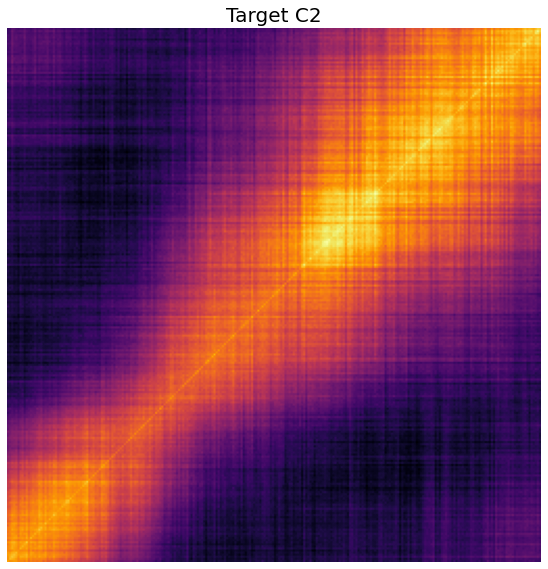

In [42]:
image_index = 198#np.random.choice(np.arange(len(rheo_data)),replace=False)
print(image_index)
#image_index = 863, 557, 380, 415, 154, 381, 201, 19
test_image = rheo_images[image_index]
test_encoding = rheo_encoded[image_index]

fig = plt.figure(figsize=(20,10))
spec = fig.add_gridspec(2,4)

ax0 = fig.add_subplot(spec[:2,:2])
ax0.imshow(test_image,plt.cm.inferno,origin='lower')
ax0.axis('off')
ax0.set_title('Target C2',fontsize=20)

#ax1 = fig.add_subplot(spec[:2,2:4])
#ax1.scatter(embedding_encoded[:,0],embedding_encoded[:,1],s=20,color='black',alpha=0.1)
#ax1.set_title('UMAP Projection',fontsize=20)
#ax1.scatter(embedding_encoded[image_index,0],embedding_encoded[image_index,1],s=250,label='Target C2')

noise_levels = [0, 0.33, 0.66, 1]#, 1]
n = 0

for row in range(2):
    for column in range(2,4):
        shift = np.random.normal(scale=noise_levels[n],size=(1,rheo_encoded.shape[1]))
#        print(shift)
        shifted_encoding = test_encoding + shift
        shifted_C2 = decoder_model(torch.tensor(shifted_encoding.reshape(-1,64),dtype=torch.float)).detach().cpu().numpy().squeeze()
        shifted_embedding = reducer_encoded.transform(shifted_encoding)[0]
        
        ax = fig.add_subplot(spec[row, column])
        ax.imshow(shifted_C2,plt.cm.inferno,origin='lower')
        ax.axis('off')
        ax.set_title('Noise Level = {}'.format(noise_levels[n]),fontsize=20)
        
        ax1.scatter(shifted_embedding[0],shifted_embedding[1],s=100,label='Noise Level = {}'.format(noise_levels[n]))
        n += 1

ax1.legend()
ax1.set_xlim([embedding_encoded[image_index,0] - 6,embedding_encoded[image_index,0] + 6])
ax1.set_ylim([embedding_encoded[image_index,1] - 6,embedding_encoded[image_index,1] + 6])

#n1 = 3
#fig.savefig('figures/ML_Comparison/Generative_Target{}_VariedNoise_{}.png'.format(image_index,n1))
#fig.savefig('figures/ML_Comparison/Generative_Target{}_VariedNoise_{}.svg'.format(image_index,n1))
n1 += 1

Artificial data in the right panel of the figure are generated with noise levels of 0 (passing original latent representation through decoder with no manipulation), 0.33, 0.66 and 1.  As noise level increases, the difference between the target $C_2$ and the artificial data increases.  While the artificial data in these cases is not similar to the target, it is still "realistic" in the sense tat the correlations are symmetric about the diagonal meaning that, in theory, these data could occur.  

For noise levels of 0.66 and 1, the data becomes increasingly complicated.  While patterns like these can be seen in our experimental data, this complexity arising from target data with relatively simple dynamics could suggest that simple trends are represented by correlated changes in the latent variables, and that treating latent variables as independent gives rise to complex dynamics.  This shows that our large 64-dimensional feature space is helpful for describe the full range of dynamics seen in real systems.

## Finally, Expert Evaluation of ML Results

To perform a quantiative test understanding the accuracy of the ML model compared to raw data analysis, we selected a target $C_2$ and plotted the 300 nearest datapoints as identified by both the ML encoding and Raw Data methods.  A set of XPCS experts were then asked to count how many of the suggested data were actually similar to the target.

For this test, a larger dataset consisting of over 13,000 individual $C_2$ was used.  These data were collected over the course of one beam-time (~5 days) using the same type of sample.

The target data was selected to have striking features (fringes) so that experts could easily evaluate binary similarity (yes or no).

Suggested $C_2$ were evaluated in groups of 20, presented in order of similarity.  Data is plotted as accuracy vs. number of suggestions so that we can evaluate how accuracy changes as that model traverses the latent/encoding space.

In [ ]:
images = #np.load('/Users/jhorwath/Documents/XPCS_Analysis/Dec2021_Dataset/Dec2021_dataset/C2_Classification/transfer_learning/norm_c2_dataset.npy',mmap_mode='r+')

fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(images[5895],plt.cm.inferno,origin='lower')
ax.axis('off')
ax.set_title('Target Data',fontsize=20)

fig.tight_layout()
#fig.savefig('figures/ML_Comparison/ExpertEval_Target5895.png')
#fig.savefig('figures/ML_Comparison/ExpertEval_Target5895.svg')

In [ ]:
n_images = np.arange(20,301,20)

### 
p1_raw = np.array([[11,12,10,6,11,8,4,5,6,8,6,5,6,5,7]]).reshape(-1,1)
p1_ml = np.array([[19,13,16,12,16,13,9,9,8,8,10,10,8,5,8]]).reshape(-1,1)
p1_raw_acc = []
p1_ml_acc = []

for i in range(len(p1_raw)):
    p1_raw_acc.append(np.sum(p1_raw[:i+1]) / n_images[i])
    p1_ml_acc.append(np.sum(p1_ml[:i+1]) / n_images[i])
p1_raw_acc = np.array(p1_raw_acc)
p1_ml_acc = np.array(p1_ml_acc)

### 
p2_raw = np.array([[11,11,6,4,11,7,4,3,4,6,5,4,5,3,5]]).reshape(-1,1)
p2_ml = np.array([[17,9,7,7,10,9,8,4,4,5,8,6,4,3,2]]).reshape(-1,1)
p2_raw_acc = []
p2_ml_acc = []

for i in range(len(p1_raw)):
    p2_raw_acc.append(np.sum(p2_raw[:i+1]) / n_images[i])
    p2_ml_acc.append(np.sum(p2_ml[:i+1]) / n_images[i])
p2_raw_acc = np.array(p2_raw_acc)
p2_ml_acc = np.array(p2_ml_acc)

### 
p3_raw = np.array([[12,14,7,5,10,8,6,6,5,8,5,6,7,5,7]]).reshape(-1,1)
p3_ml = np.array([[17,13,15,11,15,13,9,8,6,7,10,8,6,4,5]]).reshape(-1,1)
p3_raw_acc = []
p3_ml_acc = []

for i in range(len(p3_raw)):
    p3_raw_acc.append(np.sum(p3_raw[:i+1]) / n_images[i])
    p3_ml_acc.append(np.sum(p3_ml[:i+1]) / n_images[i])
p3_raw_acc = np.array(p3_raw_acc)
p3_ml_acc = np.array(p3_ml_acc)

### 
p4_raw = np.array([[13,14,8,6,10,8,6,6,7,8,6,7,8,5,7]]).reshape(-1,1)
p4_ml = np.array([[19,14,16,12,16,13,9,11,9,7,10,10,7,5,5]]).reshape(-1,1)
p4_raw_acc = []
p4_ml_acc = []

for i in range(len(p4_raw)):
    p4_raw_acc.append(np.sum(p4_raw[:i+1]) / n_images[i])
    p4_ml_acc.append(np.sum(p4_ml[:i+1]) / n_images[i])
p4_raw_acc = np.array(p4_raw_acc)
p4_ml_acc = np.array(p4_ml_acc)

n_suggestions = np.arange(0,301,20)[1:]
colors = plt.cm.Set1(np.linspace(0,1,9))

In [ ]:
fig, ax = plt.subplots(figsize=(10,5))

#ax.plot(n_suggestions,p1_ml_acc,label='Expert 1, ml',color=colors[0],linewidth=3)
ax.plot(n_suggestions,p2_ml_acc,label='Expert 2, ml',color=colors[0],linewidth=3)
ax.plot(n_suggestions,p3_ml_acc,label='Expert 3, ml',color=colors[1],linewidth=3)
ax.plot(n_suggestions,p4_ml_acc,label='Expert 4, ml',color=colors[2],linewidth=3)
ax.set_xlabel('number of suggestions',fontsize=20)
ax.set_ylabel('suggestion accuracy',fontsize=20)

#ax.plot(n_suggestions,p1_raw_acc,':',label='Expert 1, raw',color=colors[0],linewidth=3)
ax.plot(n_suggestions,p2_raw_acc,':',label='Expert 2, raw',color=colors[0],linewidth=3)
ax.plot(n_suggestions,p3_raw_acc,':',label='Expert 3, raw',color=colors[1],linewidth=3)
ax.plot(n_suggestions,p4_raw_acc,':',label='Expert 4, raw',color=colors[2],linewidth=3)

ax.hlines([0.5],0,np.max(n_suggestions),color='black',linewidth=3)
ax.legend()

fig.tight_layout()
#fig.savefig('figures/ML_Comparison/ExpertEval_Accuracy.png')
#fig.savefig('figures/ML_Comparison/ExpertEval_Accuracy.svg')

We note that in all cases the ML suggestions are superior to those garnered form the raw data.  We also note that there is variability even in the experts evaluations - this highlights the need for a quantiative method to avoid human bias from the  task of similarity analysis, since manual identification and similarity judgement is difficult even to human expert eyes.

The black horizontal line shows the 50% accuracy cutoff.  This suggests that the ML encoding is able to identify similar data with high accuracy even up to 300 neighbors away from the target data.  

Of course, the amount of similar patterns which can be identified depends on the make up of the dataset - for totally unique $C_2$ the actual distances between the neighbors must be evaluated as even nearest neighbors are unlikely to be visually similar.

# Summary of the performance difference between DL method and Raw Data analysis

Both the DL latent space analysis and direct analysis of the raw data capture general trends in the dataset - the main feature distinguising dynamics (clusters) in the dataset is the mean intensity.  Becuase of this the results for matching rheological behavior to the dynamic clusters are similar for both methods.

The major benefit of the ML method is for accuracy in similarity analysis.  Similar data appear much closer together in the ML latent space than by measuring distance between raw images.  This is highlighted by our discussion of sparsity - the low dimensionality of the latent space allows the ML similarity metric to express more subtle, or complex difference between data which are not clear in the sparse, high-dimensional raw dataset.

Finally, expert analysis of ML vs Raw Data results highlights that, even though conventional data analysis can be used to perform similar task, latent space analysis is more reliable, more accuracte, and is able to capture systematic changes in $C_2$ that will be important for future analysis.